<a href="https://colab.research.google.com/github/kwisetree/AIFFEL_quest_cr/blob/main/Exploration/SubQuestC27/Exploration_Node_6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#프로젝트 : ChatGPT와 Stable Diffusion

## Step 1. 모델 준비하기

In [ ]:
# Diffusers를 설치
!pip install --upgrade -qq git+https://github.com/huggingface/diffusers.git transformers accelerate

## Step 2. Text-to-Image Generation

In [ ]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

## Step 3. Prompt 입력하기

In [ ]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: Prompt Title: "Intelligent Monkey in the Jungle"  Subject: An intelligent monkey Setting: Deep in a lush, sun-dappled jungle Action: Jumping swiftly between tall trees Context: Wearing a scholarly coat and round glasses, mid-leap Environment: Dense foliage, vibrant tropical plants, shafts of sunlight piercing through the canopy Lighting: Warm golden sunlight with dynamic shadows Artist: In the spirit of Studio Ghibli Style: Whimsical yet realistic, painterly anime style Medium: Digital art Type: Cinematic fantasy character concept Color Scheme: Earthy greens, rich browns, soft sunlight golds Computer Graphics: Studio Ghibli-inspired, sampler DDIM, step 10, seed: 10 Quality: 4K, detailed character rendering, expressive and lively movement


In [ ]:
# 마운팅
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Step 4. 하나의 이미지 생성하기

Token indices sequence length is longer than the specified maximum sequence length for this model (150 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['in the spirit of studio ghibli style : whimsical yet realistic , painterly anime style medium : digital art type : cinematic fantasy character concept color scheme : earthy greens , rich browns , soft sunlight golds computer graphics : studio ghibli - inspired , sampler ddim , step 1 0 , seed : 1 0 quality : 4 k , detailed character rendering , expressive and lively movement']


  0%|          | 0/25 [00:00<?, ?it/s]

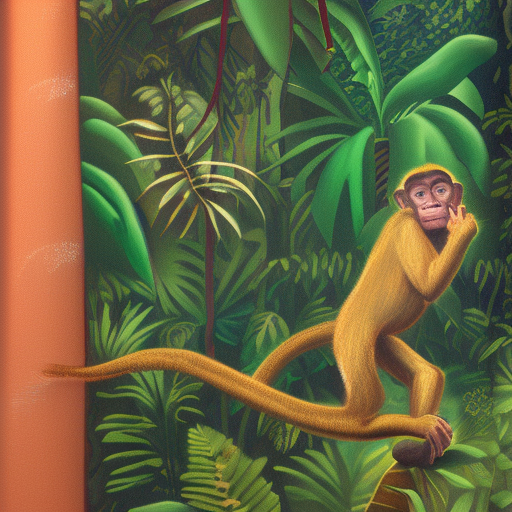

In [ ]:
# 이미지 저장 폴더 만들기
import os

# 중간 디렉토리까지 포함해서 생성
os.makedirs("/content/aiffel/diffusers", exist_ok=True)

# 입력한 프롬프트를 사용하여 이미지 생성
image = pipe(prompt, num_inference_steps=25).images[0]

# 이미지 저장
image.save("/content/aiffel/diffusers/image.png")

# 이미지 출력
image

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

prompt: Prompt Title: "Intelligent Monkey in the Jungle"  Subject: An intelligent monkey Setting: Deep in a lush, sun-dappled jungle Action: Jumping swiftly between tall trees Context: Wearing a scholarly coat and round glasses, mid-leap Environment: Dense foliage, vibrant tropical plants, shafts of sunlight piercing through the canopy Lighting: Warm golden sunlight with dynamic shadows Artist: In the spirit of Studio Ghibli Style: Whimsical yet realistic, painterly anime style Medium: Digital art Type: Cinematic fantasy character concept Color Scheme: Earthy greens, rich browns, soft sunlight golds Computer Graphics: Studio Ghibli-inspired, sampler DDIM, step 10, seed: 10 Quality: 4K, detailed character rendering, expressive and lively movement


Token indices sequence length is longer than the specified maximum sequence length for this model (150 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['in the spirit of studio ghibli style : whimsical yet realistic , painterly anime style medium : digital art type : cinematic fantasy character concept color scheme : earthy greens , rich browns , soft sunlight golds computer graphics : studio ghibli - inspired , sampler ddim , step 1 0 , seed : 1 0 quality : 4 k , detailed character rendering , expressive and lively movement']


  0%|          | 0/50 [00:00<?, ?it/s]

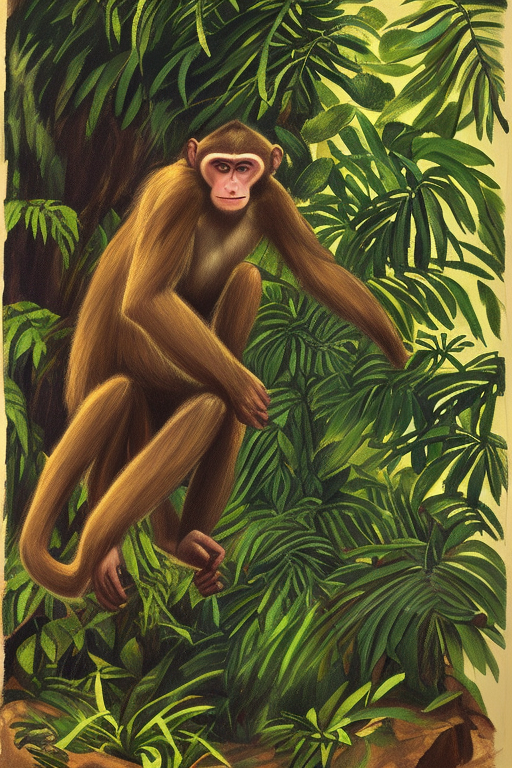

In [ ]:
import torch
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler
import os

# 디바이스 설정
device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)
pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

# 프롬프트 입력
prompt = str(input('prompt: '))  # 영어로 입력하세요

# 하이퍼파라미터 설정
height = 768                   # 8의 배수
width = 512                    # 8의 배수
num_inference_steps = 50       # denoising step 수 (기본: 25 → 향상)
guidance_scale = 8.5           # 텍스트에 얼마나 충실할지 (기본 없음 → 추가)

# 이미지 저장 폴더 생성
os.makedirs("/content/aiffel/diffusers", exist_ok=True)

# 이미지 생성
image = pipe(
    prompt=prompt,
    height=height,
    width=width,
    num_inference_steps=num_inference_steps,
    guidance_scale=guidance_scale
).images[0]

# 이미지 저장
image_path = "/content/aiffel/diffusers/image.png"
image.save(image_path)

# 이미지 출력
image

## Step 5. 여러 개의 이미지 생성하기

In [ ]:
# 파이썬 이미지 처리 라이브러리 pillow 불러오기
from PIL import Image

# 틀 만들기
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    grid_w, grid_h = grid.size

    for i, img in enumerate(imgs):
        grid.paste(img, box = (i%cols * w, i // cols * h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

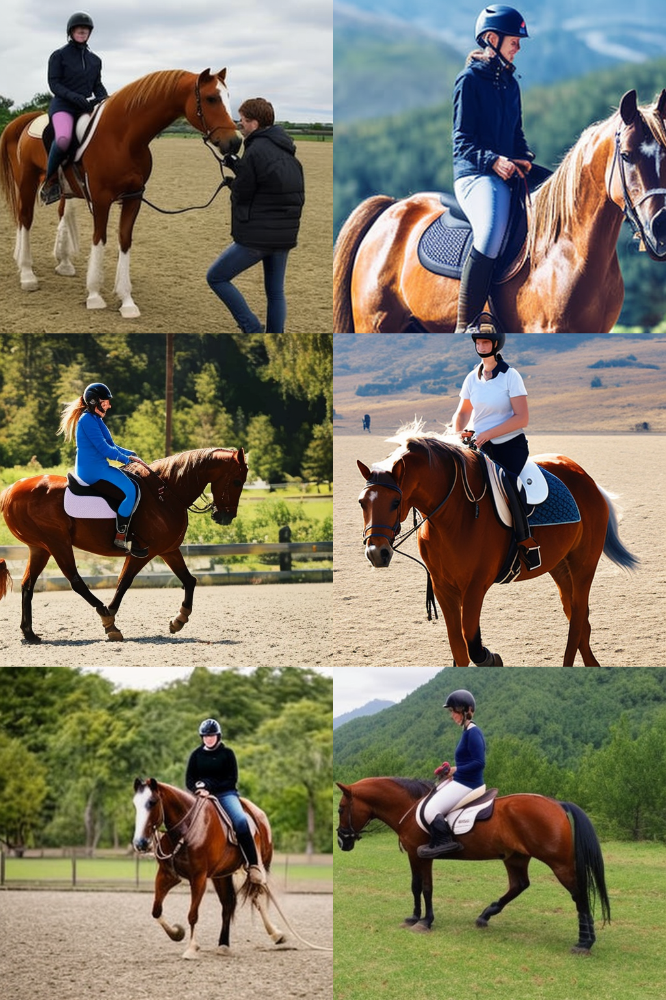

In [ ]:
# 이미지의 개수
num_images = 6

# 프롬프트 입력
prompt = ['a horse riding a person'] * num_images

# 이미지 생성
images = pipe(prompt).images

# 이미지 출력
grid = image_grid(images, rows= 3, cols= 2)
grid

## Step 6. 다양한 프롬프트, 이미지 개수 시도하기

  0%|          | 0/40 [00:00<?, ?it/s]

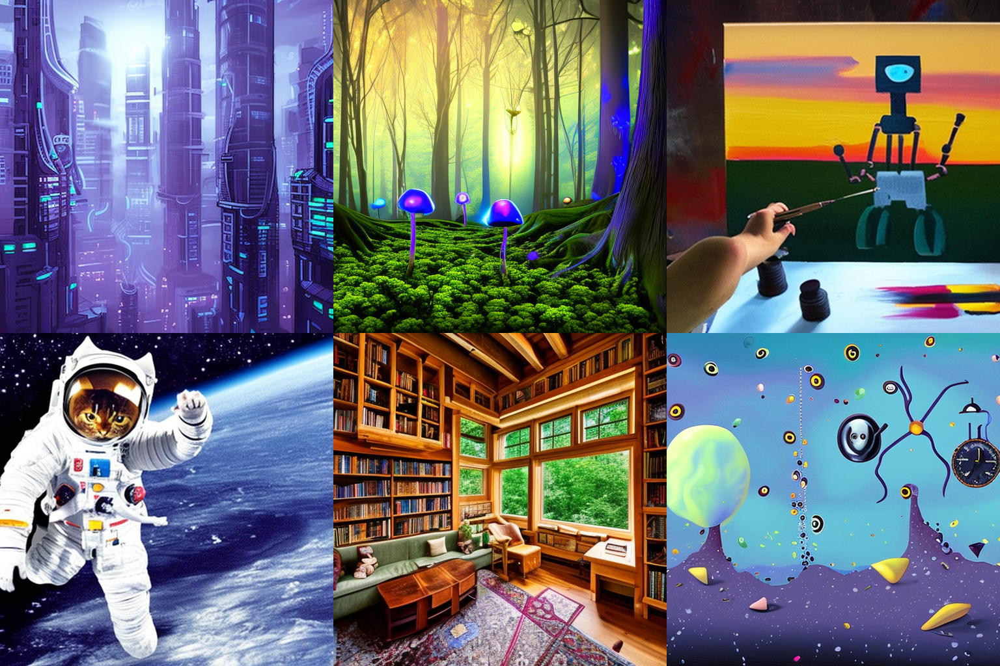

In [ ]:
from PIL import Image

# 그리드 만들기 함수
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

# 다양한 프롬프트 설정
prompts = [
    "a futuristic city at night, cyberpunk style",
    "a magical forest with glowing mushrooms",
    "a robot painter painting a sunset",
    "a cat wearing astronaut suit floating in space",
    "a cozy library inside a treehouse",
    "a surreal dreamscape with melting clocks"
]

# 이미지 생성
images = pipe(prompts, num_inference_steps=40, guidance_scale=8.0).images

# 그리드로 출력 (2행 3열)
grid = image_grid(images, rows=2, cols=3)
grid


## Step 7. Image-to-Image Generation

In [ ]:
# Image-to-Image Generation 파이프라인 불러오기
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

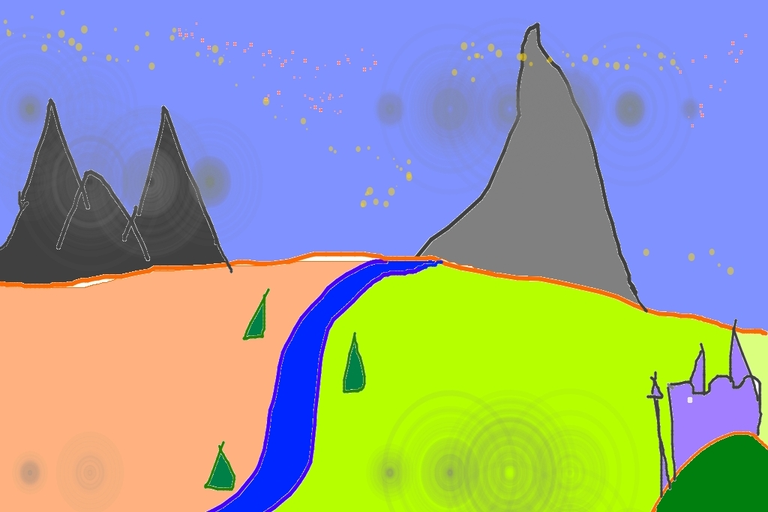

In [ ]:
import requests
from io import BytesIO

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

# url 호출하기
response = requests.get(url)

# 이미지 열기
init_img = Image.open(BytesIO(response.content)).convert("RGB")  # 이미지를 메모리로 읽어와서 RGB로 변경합니다.
init_img = init_img.resize((768, 512))  # 이미지의 크기를 조절합니다.
init_img

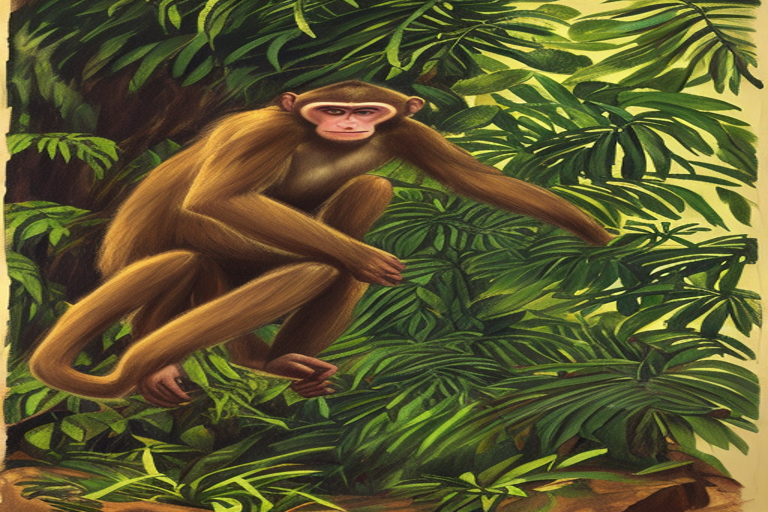

In [ ]:
init_img = Image.open("/content/aiffel/diffusers/image.png", mode = 'r')
init_img = init_img.resize((768, 512))
init_img

In [ ]:
prompt = "A fantasy landscape, trending on artstation"

  0%|          | 0/37 [00:00<?, ?it/s]

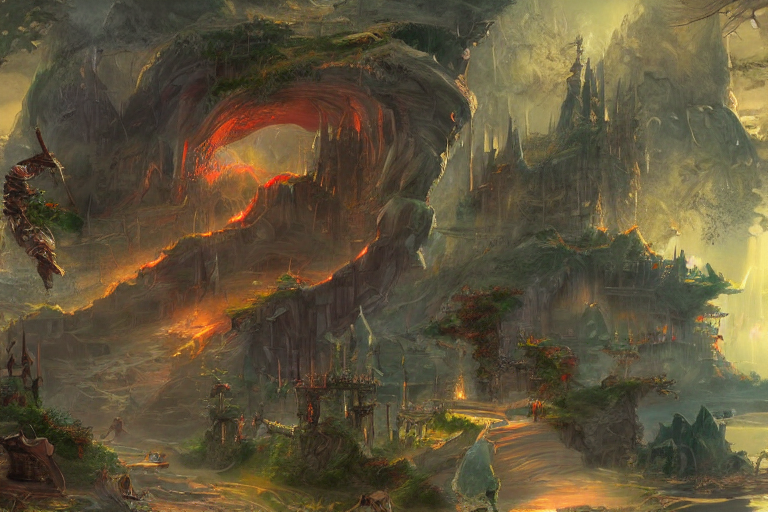

In [ ]:
generator = torch.Generator(device=device).manual_seed(1024)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/content/aiffel/diffusers/fantasy_landscape.png")
images[0]

In [ ]:
from PIL import Image
import torch
from diffusers import StableDiffusionImg2ImgPipeline
import requests
from io import BytesIO
import os

# 파이프라인 불러오기
device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
).to(device)

# 초기 이미지 준비
url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"
response = requests.get(url)
init_img = Image.open(BytesIO(response.content)).convert("RGB").resize((768, 512))

# 프롬프트
prompt = "A fantasy landscape, trending on artstation"

# 저장 폴더 생성
save_path = "/content/aiffel/diffusers/img2img_results"
os.makedirs(save_path, exist_ok=True)

# 다양한 하이퍼파라미터 조합 실험
strength_values = [0.5, 0.75, 0.9]
guidance_values = [5.0, 7.5, 10.0]

idx = 0
for s in strength_values:
    for g in guidance_values:
        image = pipe(
            prompt=prompt,
            image=init_img,
            strength=s,
            guidance_scale=g,
            generator=torch.Generator(device=device).manual_seed(1024 + idx)
        ).images[0]

        filename = f"fantasy_s{s}_g{g}.png"
        image.save(os.path.join(save_path, filename))
        print(f"Saved: {filename}")
        idx += 1


/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:781: FutureWarning: You have passed 2 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/45 [00:00<?, ?it/s]

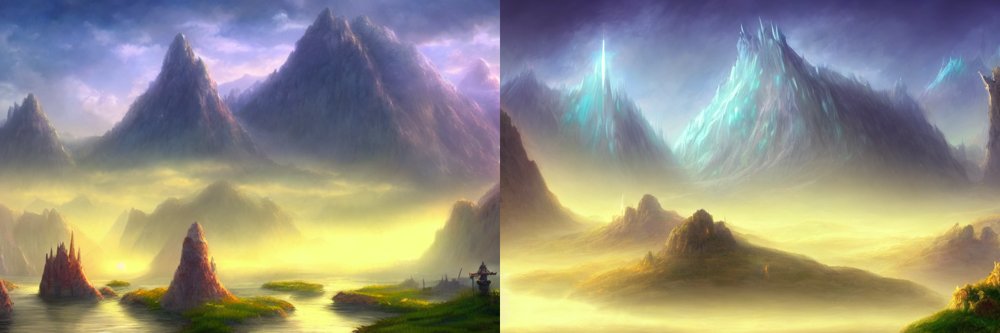

In [ ]:
num_images = 2

# 프롬프트 입력
prompt = ['A fantasy landscape, trending on artstation'] * num_images

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1024)
images = pipe(prompt=prompt, image=init_img, strength=0.9, guidance_scale=13.5, num_inference_steps=50, generator=generator).images
images

# 이미지 출력
grid = image_grid(images, rows=1, cols=2)
grid

/usr/local/lib/python3.11/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:781: FutureWarning: You have passed 4 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/32 [00:00<?, ?it/s]

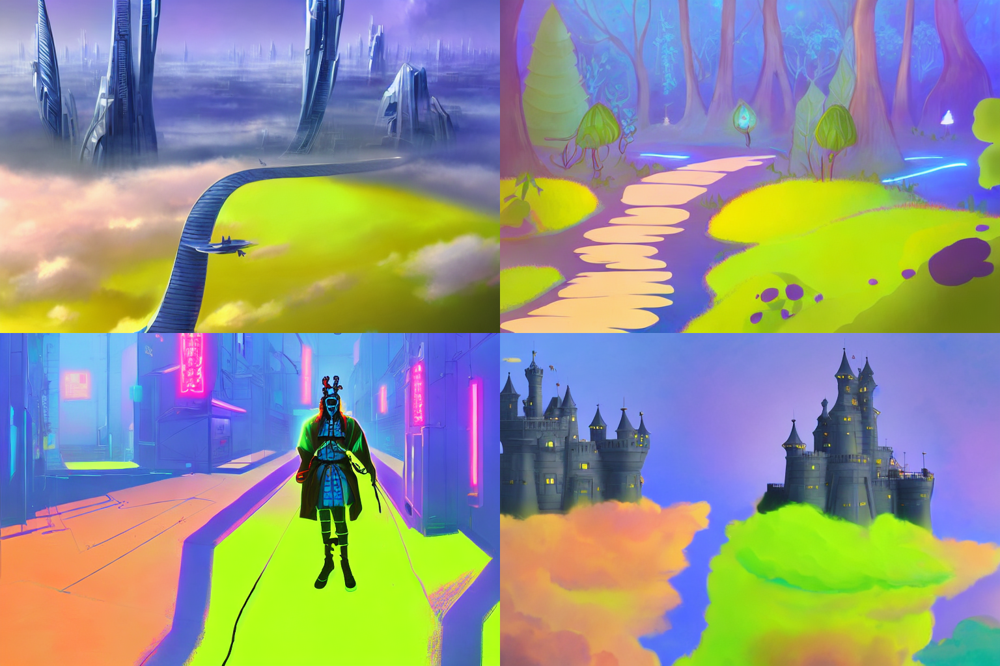

In [ ]:
num_images = 4

# 다양한 프롬프트 설정
prompts = [
    "A futuristic city in the clouds, trending on artstation",
    "An enchanted forest with glowing plants, trending on artstation",
    "A cyberpunk samurai in a neon-lit alley, trending on artstation",
    "A floating castle in the sky during sunset, trending on artstation"
]

# 동일한 init 이미지로 다양한 프롬프트 적용
generator = torch.Generator(device=device).manual_seed(2025)
images = pipe(
    prompt=prompts,
    image=init_img,
    strength=0.8,
    guidance_scale=12.0,
    num_inference_steps=40,
    generator=generator
).images

# 출력
grid = image_grid(images, rows=2, cols=2)
grid


In [ ]:
torch.cuda.empty_cache()